### Computational Photography - lab 2
###### Filip Gromuł
------------------------------------------------


CPU times: user 30.5 ms, sys: 0 ns, total: 30.5 ms
Wall time: 29.5 ms


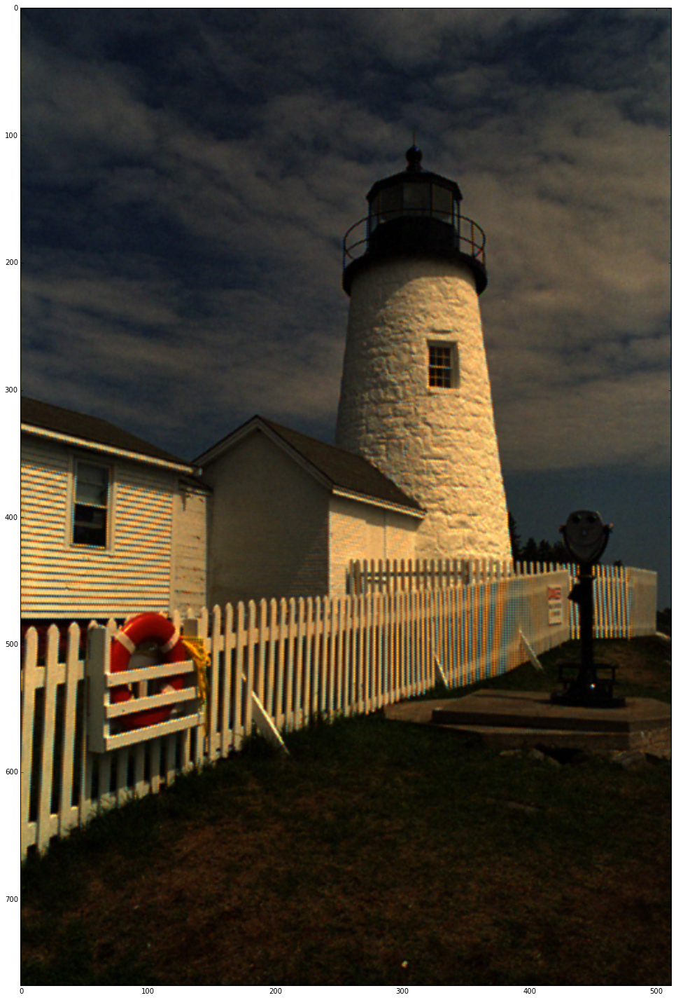

In [1]:
%matplotlib inline

import imageio
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.image as mpimg
from scipy import ndimage
import numpy as np

lighthouse = 'data/lighthouse_RAW_noisy_sigma0.01.png'
hall = 'data/raw/hall.png'
text = 'data/raw/text.png'

image_path = lighthouse

img=imageio.imread(image_path)

class Tile:
    red_tile = np.array([[True, False],[False,False]])
    red_vertical_tile = np.array([[False, False],[True,False]])
    red_horizontal_tile = np.array([[False,True],[False,False]])
    red_cross_tile = np.array([[False,False],[False,True]])

    green_tile = np.array([[False,True],[True,False]])
    green_4way_tile = np.logical_not(green_tile)

    blue_tile = red_cross_tile
    blue_vertical_tile = red_horizontal_tile
    blue_horizontal_tile = red_vertical_tile
    blue_cross_tile = red_tile

def tile_up(image, tile):      
    tiled = np.tile(tile, ((image.shape[0]+image.shape[0]%2)/2, (image.shape[1]+image.shape[1]%2)/2))    
    if image.shape[0]%2==1:
        tiled = np.delete(tiled, -1, 0)
    if image.shape[1]%2==1:
        tiled = np.delete(tiled, -1, 1)
    return tiled

def convolve(array, kernel):
    return ndimage.convolve(array, np.array(kernel), mode='constant', cval=0.0)

def demosaic_simple(img):     
    # compute local averages of pixel values
    horizontal_average = convolve(img, [[.5,0,.5]])
    vertical_average = convolve(img, [[.5],[0],[.5]])
    four_way_average = convolve(img, [[0,.25,0],[.25,0,.25],[0,.25,0]])
    cross_average = convolve(img, [[.25,0,.25],[0,0,0],[.25,0,.25]])

    red = (img * tile_up(img, Tile.red_tile)) +\
        (horizontal_average * tile_up(img, Tile.red_horizontal_tile)) +\
        (vertical_average * tile_up(img, Tile.red_vertical_tile)) +\
        (cross_average * tile_up(img, Tile.red_cross_tile))

    green = (img * tile_up(img, Tile.green_tile)) +\
        (four_way_average * tile_up(img, Tile.green_4way_tile))

    blue = (img * tile_up(img, Tile.blue_tile)) +\
        (horizontal_average * tile_up(img, Tile.blue_horizontal_tile)) +\
        (vertical_average * tile_up(img, Tile.blue_vertical_tile)) +\
        (cross_average * tile_up(img, Tile.blue_cross_tile))
    return (red,green,blue)

%time demosaiced = demosaic_simple(img)

# naive implementation:
#for x in range(1,img.shape[0]-1):
#    for y in range(1,img.shape[1]-1):
#        if x%2==0 and y%2==0:
#            red[x,y] = img[x,y]
#            blue[x,y] = (img[x-1,y-1]+img[x+1,y+1]+img[x-1,y+1]+img[x+1,y-1])/4
#            green[x,y] = (img[x-1,y]+img[x+1,y]+img[x,y+1]+img[x,y-1])/4
#        elif x%2 != y%2:
#            green[x,y] = img[x,y]
#            if x%2==0:
#                red[x,y] = (img[x,y+1]+img[x,y-1])/2
#                blue[x,y] = (img[x-1,y]+img[x+1,y])/2
#            else:
#                red[x,y] = (img[x-1,y]+img[x+1,y])/2
#                blue[x,y] = (img[x,y+1]+img[x,y-1])/2        
#        else:
#            blue[x,y] = img[x,y]
#            red[x,y] = (img[x-1,y-1]+img[x+1,y+1]+img[x-1,y+1]+img[x+1,y-1])/4
#            green[x,y] = (img[x-1,y]+img[x+1,y]+img[x,y+1]+img[x,y-1])/4
        
stacked = np.dstack(demosaiced)
plt.figure(figsize=(20,25))
plt.imshow(stacked)
imageio.imwrite("result/simple_demosaic.png", stacked)
#plt.imshow(cross_average * tile_up(red_cross_tile), cmap = cm.Greys_r)

CPU times: user 70.1 ms, sys: 194 µs, total: 70.3 ms
Wall time: 69.7 ms


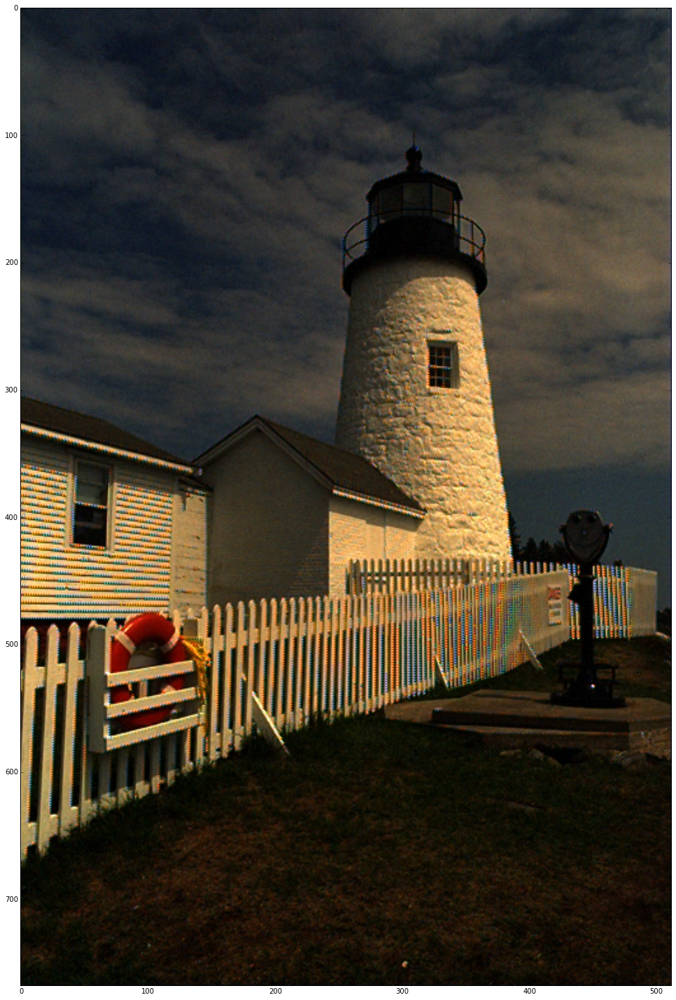

In [184]:
img=mpimg.imread(image_path)

class ImageAverages:
    def __init__(self, image):
        self.horizontal = convolve(image, [[.5,0,.5]])
        self.vertical = convolve(image, [[.5],[0],[.5]])
        self.four_way = convolve(image, [[0,.25,0],[.25,0,.25],[0,.25,0]])
        self.cross = convolve(image, [[.25,0,.25],[0,0,0],[.25,0,.25]])

def edge_based_demosaic(img):
    # compute local averages of pixel values
    averages = ImageAverages(img)

    # compute the horizontal and vertical gradient for the entire image
    h_gradient = convolve(img, [[1, 0, -1]])
    v_gradient = convolve(img, [[1], [0], [-1]])

    h_greater = h_gradient > v_gradient
    v_greater = v_gradient > h_gradient
    equal = h_gradient == v_gradient

    # compute green channel
    
    green_mask = tile_up(img, Tile.green_tile)
    not_green_mask = np.logical_not(green_mask)
    
    green = img * green_mask +\
        averages.vertical * h_greater * not_green_mask +\
        averages.horizontal * v_greater * not_green_mask +\
        averages.four_way * equal * not_green_mask
    
    # compute red channel
    
    red_mask = tile_up(img, Tile.red_tile)
    
    red_minus_green = red_mask*(img - green)
    red_averages = ImageAverages(red_minus_green)
        
    red = (red_minus_green) +\
            (red_averages.horizontal) +\
            (red_averages.vertical) +\
            (red_averages.cross)
    red += green
    red = np.clip(red, 0, 1)

    # compute blue channel
    
    blue_mask = tile_up(img, Tile.blue_tile)
    
    blue_minus_green = blue_mask*(img - green)
    blue_averages = ImageAverages(blue_minus_green)
    
    blue = (blue_minus_green) +\
        (blue_averages.horizontal) +\
        (blue_averages.vertical) +\
        (blue_averages.cross)
    blue += green
    blue = np.clip(blue, 0, 1)
        
    return np.dstack((red,green,blue))

%time demosaiced = edge_based_demosaic(img)

plt.figure(figsize=(20,25))
plt.imshow(demosaiced)
imageio.imwrite("result/green_based_demosaic.png", demosaiced)


CPU times: user 86.9 ms, sys: 0 ns, total: 86.9 ms
Wall time: 86.3 ms


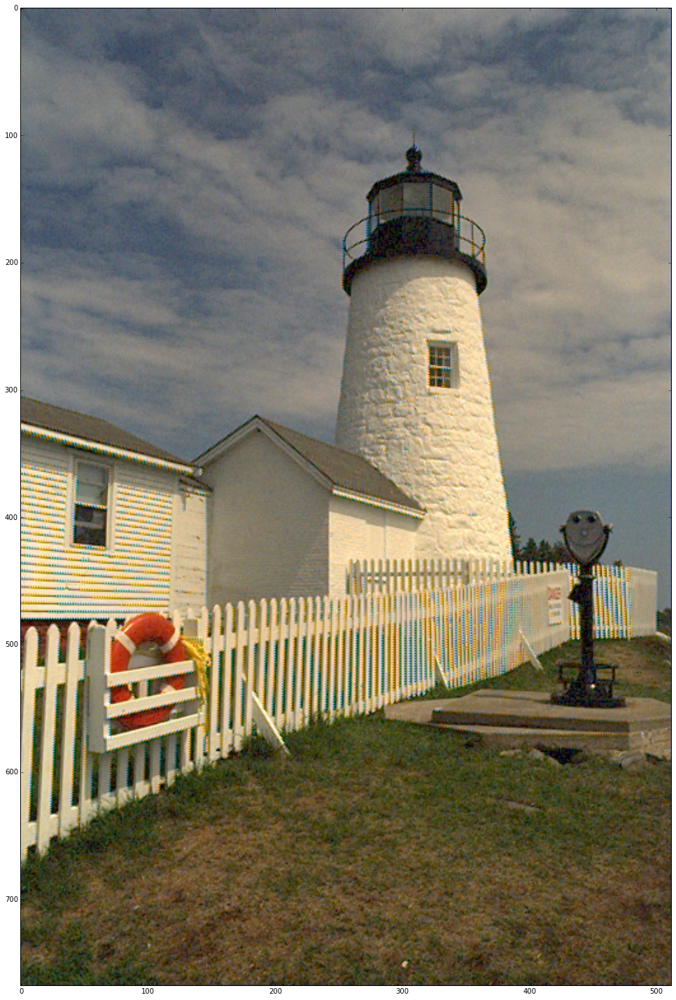

In [185]:
def gamma_correction(image, gamma=(1/2.2)):
    return image**gamma

%time corrected = gamma_correction(demosaiced) 

plt.figure(figsize=(20,25))
plt.imshow(corrected)
imageio.imwrite("result/gamma_corrected_green_based.png", corrected)

In [190]:
# conversions constants from http://www.fourcc.org/fccyvrgb.php

def rgb_to_YCbCr(R, G, B):
    Y  =      (0.257 * R) + (0.504 * G) + (0.098 * B) + 1./16.
    Cr = V =  (0.439 * R) - (0.368 * G) - (0.071 * B) + .5
    Cb = U = -(0.148 * R) - (0.291 * G) + (0.439 * B) + .5
    return (Y,Cb,Cr)

def YCbCr_to_rgb(Y, CB, CR):
    B = 1.164 * (Y - 1./16.)                     + 2.018 * (CB - .5)
    G = 1.164 * (Y - 1./16.) - 0.813 * (CR - .5) - 0.391 * (CB - .5)
    R = 1.164 * (Y - 1./16.) + 1.596 * (CR - .5)    
    R = np.clip(R, 0, 1)
    G = np.clip(G, 0, 1)
    B = np.clip(B, 0, 1)
    return (R, G, B)

#y,cb,cr = rgb_to_YCbCr(*demosaic_simple(img))
#r,g,b = YCbCr_to_rgb(y,cb,cr)
#plt.figure(figsize=(20,25))
#plt.imshow(np.dstack((r,g,b)))

In [193]:
def filter_chrominance(r, g, b):
    y,cb,cr = rgb_to_YCbCr(r,g,b)
    cb = ndimage.filters.median_filter(cb, size=3)
    cr = ndimage.filters.median_filter(cr, size=3)
    return YCbCr_to_rgb(y,cb,cr)

filtered_image = filter_chrominance(*demosaic_simple(img))

#plt.figure(figsize=(20,25))
#plt.imshow(np.dstack(filtered_image))

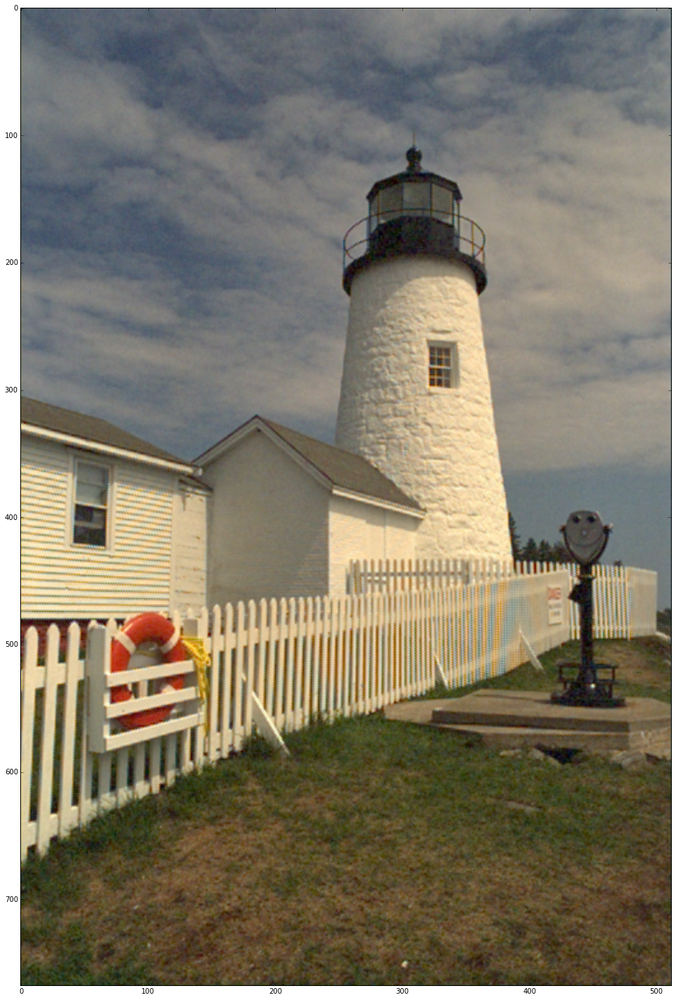

In [194]:
filtered_stacked = gamma_correction(np.dstack(filtered_image))

plt.figure(figsize=(20,25))
plt.imshow(filtered_stacked)
imageio.imwrite("result/gamma_corrected_filtered.png", filtered_stacked)